# 1. Introduction

The analysis concentrates on assessing the profitability of sales data for a bike and bike accessories brand. Utilizing descriptive techniques, the analysis identifies the most lucrative product categories as well as significant losses in certain segments across different countries. Given the absence of currency specification, it is presumed that the dataset is denominated in USD.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
df=pd.read_csv('./SalesForCourse_quizz_table.csv')

In [3]:
df.head()

,index,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
0,0,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.0
1,1,2016.0,February,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.0
2,2,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.0
3,3,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.0
4,4,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.0


In [4]:
df.tail()

,index,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
34862,34862,2016.0,February,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,2.0,1160.0,985.500000,2320.0,1971.000000
34863,34863,2015.0,March,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,1.0,2049.0,1583.000000,2049.0,1583.000000
34864,34864,2015.0,April,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,3.0,683.0,560.666667,2049.0,1682.000000
34865,34865,2015.0,August,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,1.0,2320.0,1568.000000,2320.0,1568.000000
34866,34866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,641.532095


In [5]:
df.set_index('index', inplace=True)

In [6]:
df.head()

,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
index,,,,,,,,,,,,,
0,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.0
1,2016.0,February,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.0
2,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.0
3,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.0
4,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.0


# 2. Understanding the Dataset

In [7]:
df.shape

(34867, 13)

No of rows : 34867

No of columns : 13

In [8]:
df.columns

Index(['Year', 'Month', 'Customer Age', 'Customer Gender', 'Country', 'State',
       'Product Category', 'Sub Category', 'Quantity', 'Unit Cost',
       'Unit Price', 'Cost', 'Revenue'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34867 entries, 0 to 34866
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              34866 non-null  float64
 1   Month             34866 non-null  object 
 2   Customer Age      34866 non-null  float64
 3   Customer Gender   34866 non-null  object 
 4   Country           34866 non-null  object 
 5   State             34866 non-null  object 
 6   Product Category  34866 non-null  object 
 7   Sub Category      34866 non-null  object 
 8   Quantity          34866 non-null  float64
 9   Unit Cost         34866 non-null  float64
 10  Unit Price        34866 non-null  float64
 11  Cost              34866 non-null  float64
 12  Revenue           34867 non-null  float64
dtypes: float64(7), object(6)
memory usage: 3.7+ MB


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,34866.0,2015.569237,0.495190,2015.000000,2015.000000,2016.0,2016.0,2016.0
Customer Age,34866.0,36.382895,11.112902,17.000000,28.000000,35.0,44.0,87.0
Quantity,34866.0,2.002524,0.813936,1.000000,1.000000,2.0,3.0,3.0
Unit Cost,34866.0,349.880567,490.015846,0.670000,45.000000,150.0,455.0,3240.0
Unit Price,34866.0,389.232485,525.319091,0.666667,53.666667,179.0,521.0,5082.0
Cost,34866.0,576.004532,690.500395,2.000000,85.000000,261.0,769.0,3600.0
Revenue,34867.0,640.870093,736.640033,2.000000,102.000000,319.0,902.0,5082.0


In [11]:
df.dtypes

Year                float64
Month                object
Customer Age        float64
Customer Gender      object
Country              object
State                object
Product Category     object
Sub Category         object
Quantity            float64
Unit Cost           float64
Unit Price          float64
Cost                float64
Revenue             float64
dtype: object

In [12]:
allColumns=set(df.columns)
numColumns=set(df._get_numeric_data())
catColumns=set(allColumns - numColumns)

In [13]:
print(f"All columns : {allColumns}\n")
print(f"Numerical columns : {numColumns}\n")
print(f"Categorical columns : {catColumns}\n")

All columns : {'Cost', 'Sub Category', 'Product Category', 'Unit Cost', 'Unit Price', 'Customer Age', 'Quantity', 'State', 'Revenue', 'Customer Gender', 'Year', 'Month', 'Country'}

Numerical columns : {'Cost', 'Unit Cost', 'Unit Price', 'Customer Age', 'Quantity', 'Revenue', 'Year'}

Categorical columns : {'State', 'Country', 'Customer Gender', 'Sub Category', 'Product Category', 'Month'}



In [14]:
for i in catColumns:
    print()
    print(f"Value counts for {i} column : ")
    print(df[i].value_counts())
    print()
    print(f"Unique values for {i} column : ")
    print(df[i].unique())
    print()
    print(f"{i} column has {len(list(df[i].unique()))} unique values.\n")
    print("*********************************************************************************")


Value counts for State column : 
State
California             10332
England                 6421
Washington              5204
Oregon                  2446
Saarland                1287
Nordrhein-Westfalen     1171
Hessen                  1112
Seine (Paris)           1092
Hamburg                  869
Seine Saint Denis        796
Nord                     787
Bayern                   668
Hauts de Seine           509
Essonne                  465
Yveline                  442
Seine et Marne           183
Moselle                  181
Loiret                   178
Val d'Oise               130
Garonne (Haute)          100
Brandenburg               94
Val de Marne              75
Charente-Maritime         70
Somme                     61
Loir et Cher              57
Pas de Calais             42
Illinois                  14
Texas                     14
Ohio                      13
New York                  10
Florida                    7
South Carolina             5
Utah                       5
Ken

In [15]:
df.duplicated().sum()

5

There are 5 duplicate values in that dataset.

In [16]:
df.drop_duplicates(inplace=True)

In [17]:
df.duplicated().sum()

0

In [18]:
df.shape

(34862, 13)

In [19]:
df.isnull().sum()

Year                1
Month               1
Customer Age        1
Customer Gender     1
Country             1
State               1
Product Category    1
Sub Category        1
Quantity            1
Unit Cost           1
Unit Price          1
Cost                1
Revenue             0
dtype: int64

In [20]:
df[df.isnull().any(axis=1)]

,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
index,,,,,,,,,,,,,
34866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,641.532095


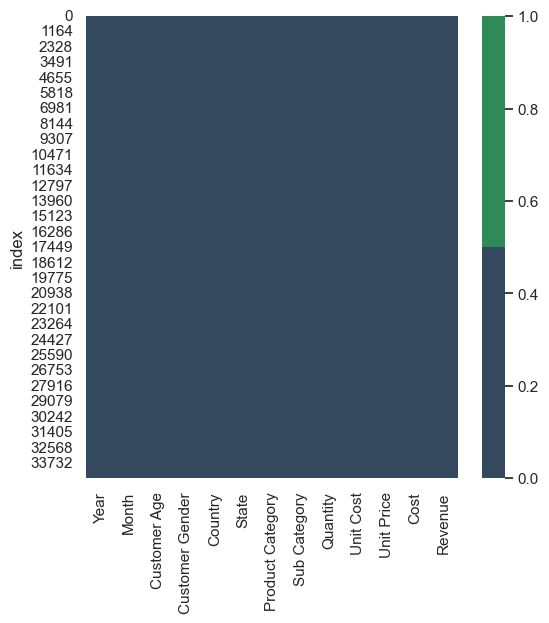

In [23]:
sns.set()
colours = ['#34495E', 'seagreen']
plt.figure(figsize=(6, 6))
sns.heatmap(df.isnull(), cmap=colours)
plt.show()

There are ony one row contains the null values. Let drop that column.

In [79]:
df.dropna(axis=0, inplace=True)

In [80]:
df.isnull().sum()

Year                0
Month               0
Customer Age        0
Customer Gender     0
Country             0
State               0
Product Category    0
Sub Category        0
Quantity            0
Unit Cost           0
Unit Price          0
Cost                0
Revenue             0
dtype: int64

In [81]:
df[df.isnull().any(axis=1)]

,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
index,,,,,,,,,,,,,


In [82]:
df.shape

(34866, 13)

Now it contain 34866 rows and 13 columns.

# 3. Preprocessing

In [83]:
df['Profit']=df['Revenue']-df['Cost']
df['Unit Margin']=df['Unit Price']-df['Unit Cost']

In [84]:
countryGroup=df.groupby('Country').sum('Profit').sort_values('Profit', ascending=True)
countryGroup

,Year,Customer Age,Quantity,Unit Cost,Unit Price,Cost,Revenue,Profit,Unit Margin
Country,,,,,,,,,
France,10416495.0,182039.0,10373.0,1935155.55,2.092057e+06,3173447.0,3446104.0,272657.0,156901.949990
United Kingdom,12941894.0,228472.0,12822.0,2386799.22,2.585683e+06,3947265.0,4276220.0,328955.0,198883.946652
United States,36433371.0,676685.0,36239.0,5864744.41,6.292661e+06,9676577.0,10377742.0,701165.0,427916.589981
Germany,10483077.0,181330.0,10386.0,2012236.66,2.600578e+06,3285685.0,4244510.0,958825.0,588341.506667


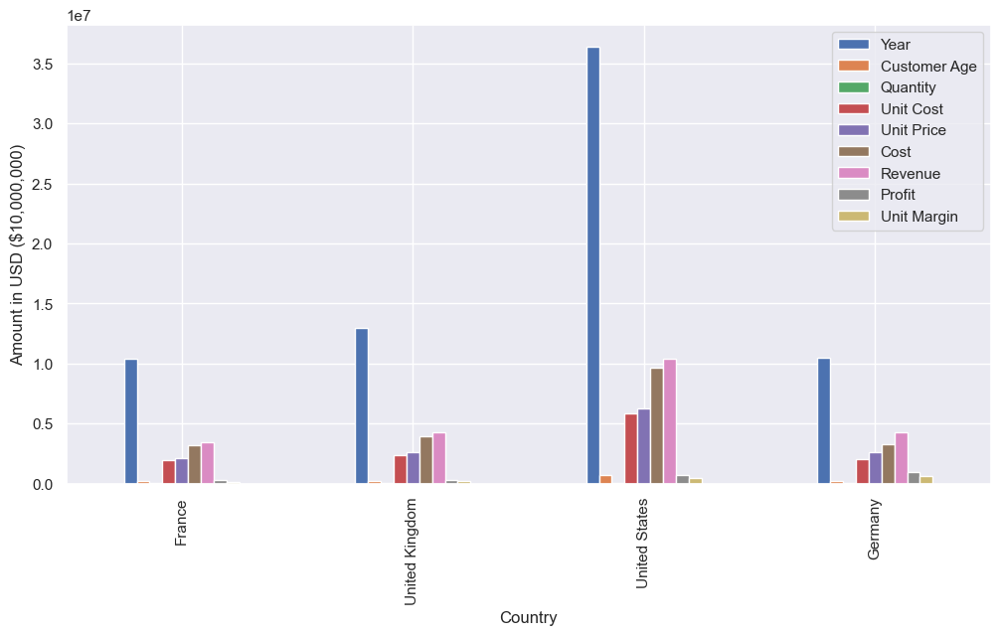

In [85]:
ax=countryGroup.plot(kind='bar', figsize=(12, 6))
ax.set_ylabel('Amount in USD ($10,000,000)')
plt.show()

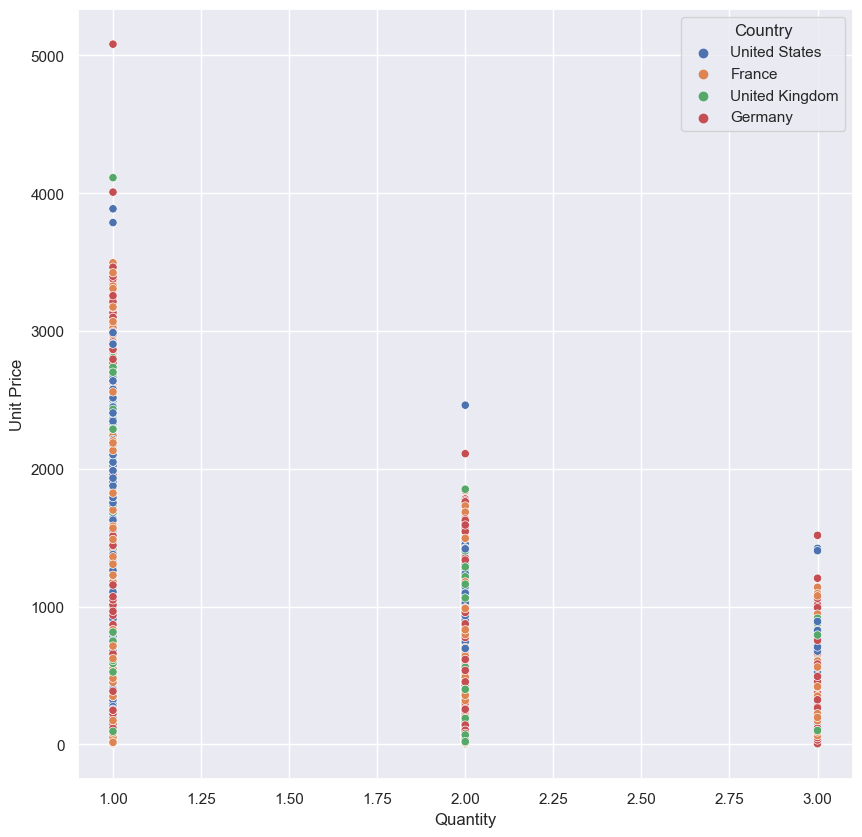

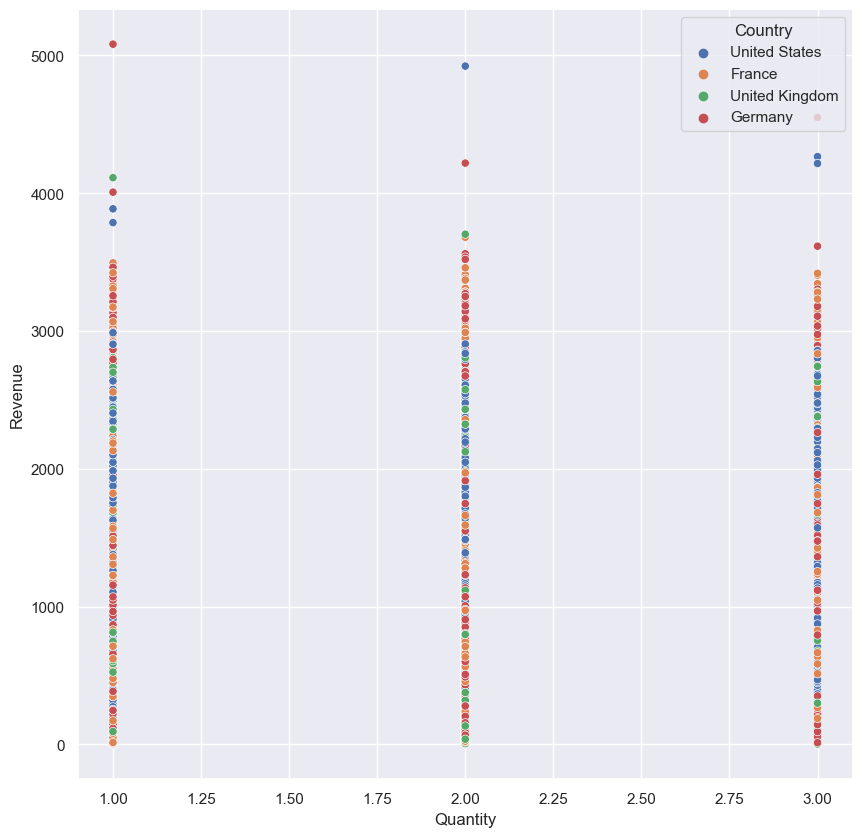

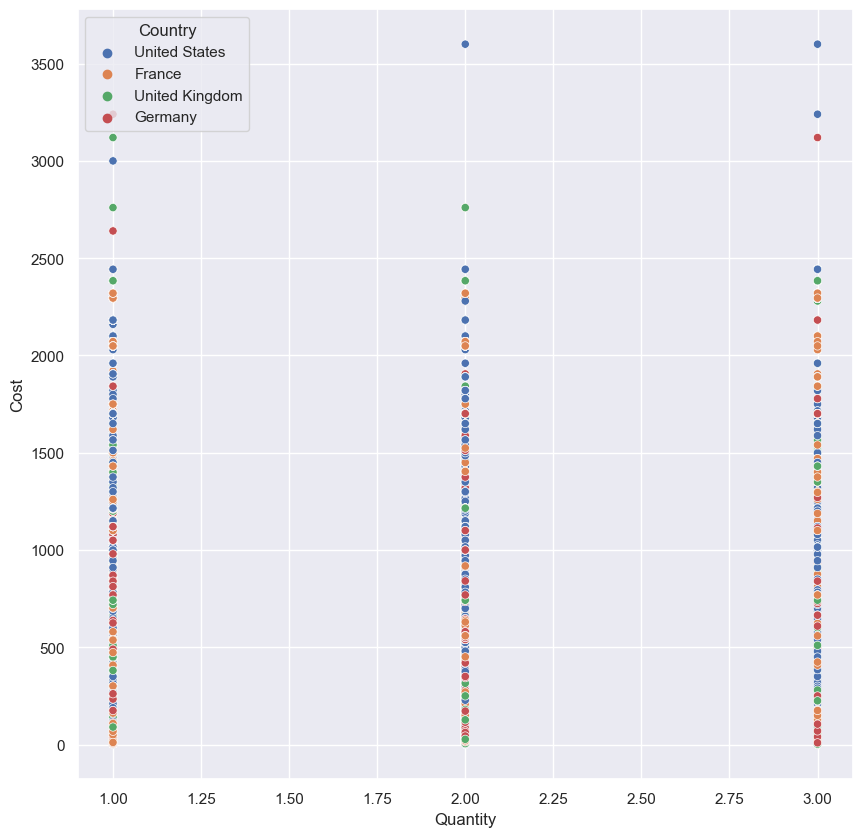

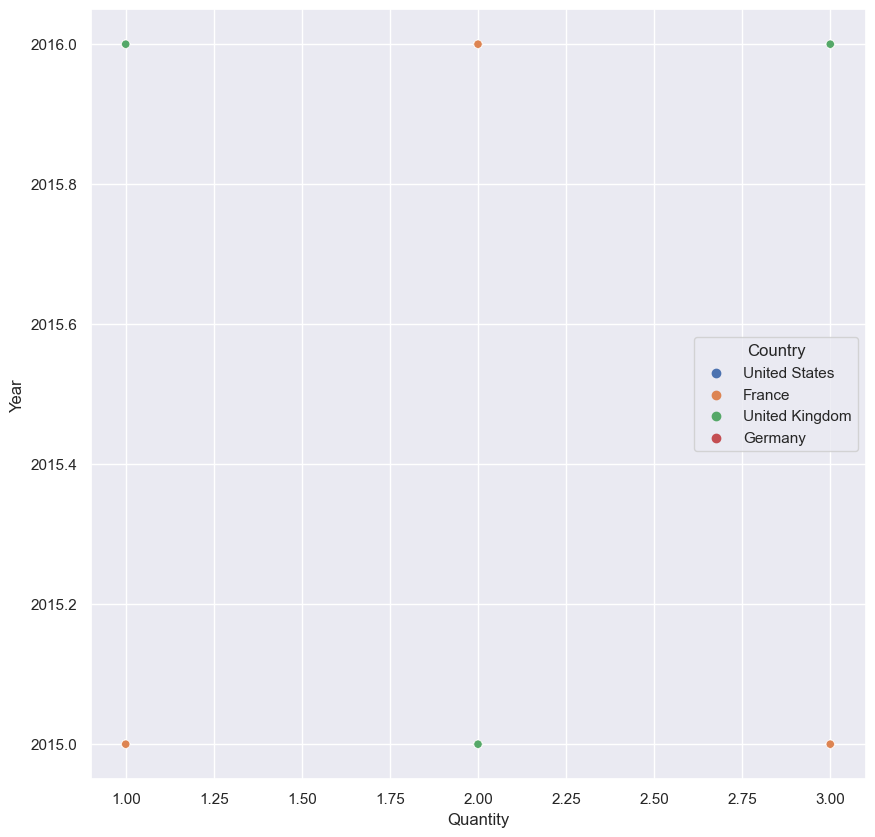

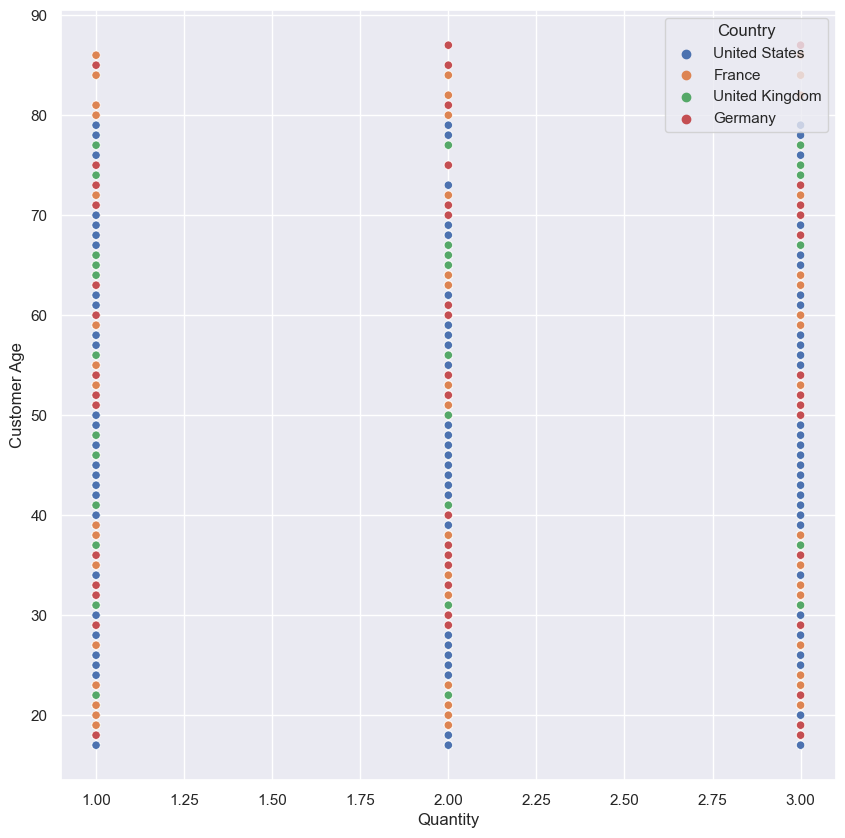

...

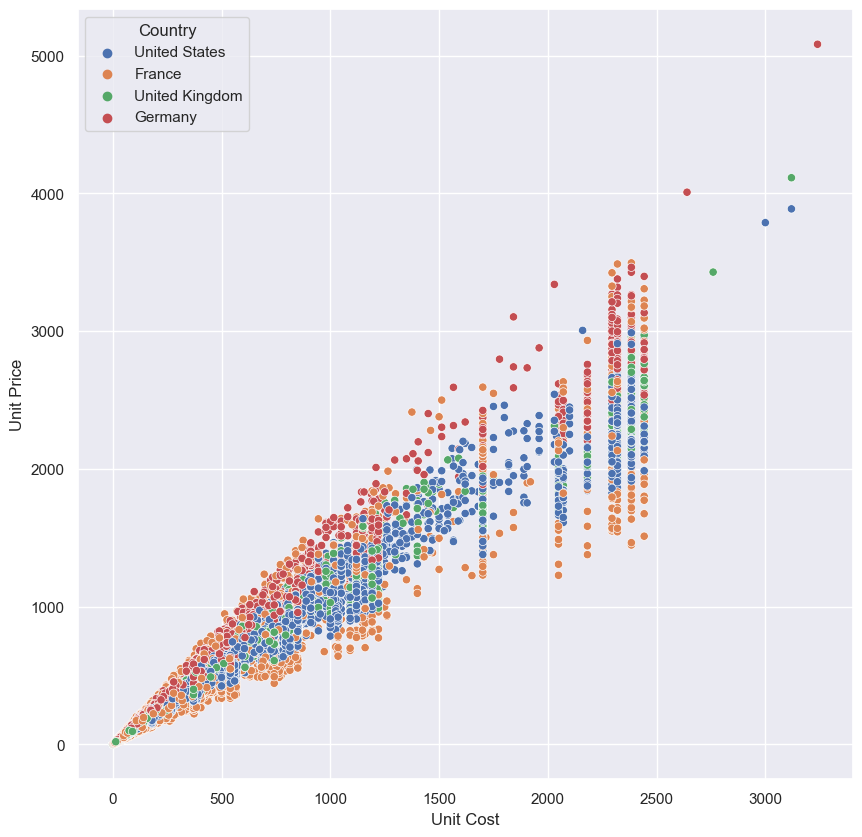

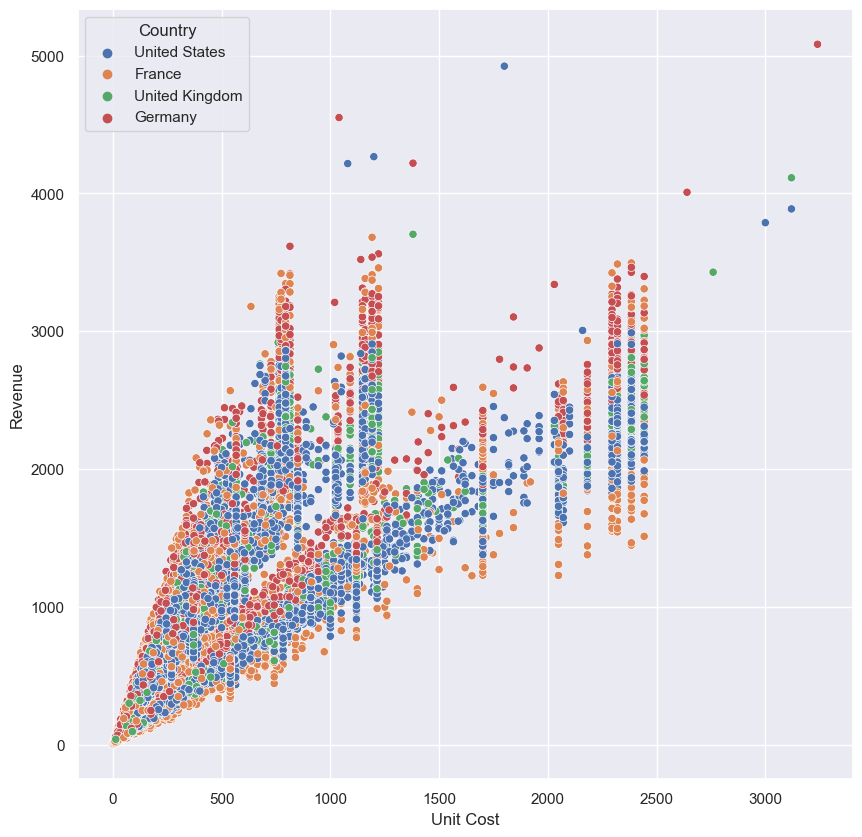

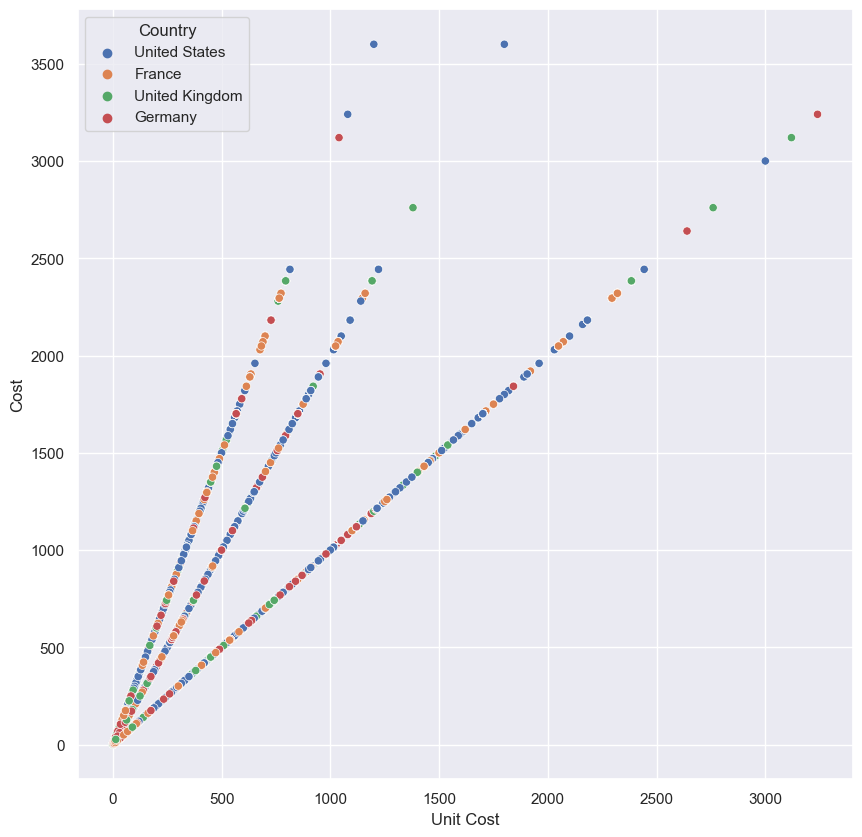

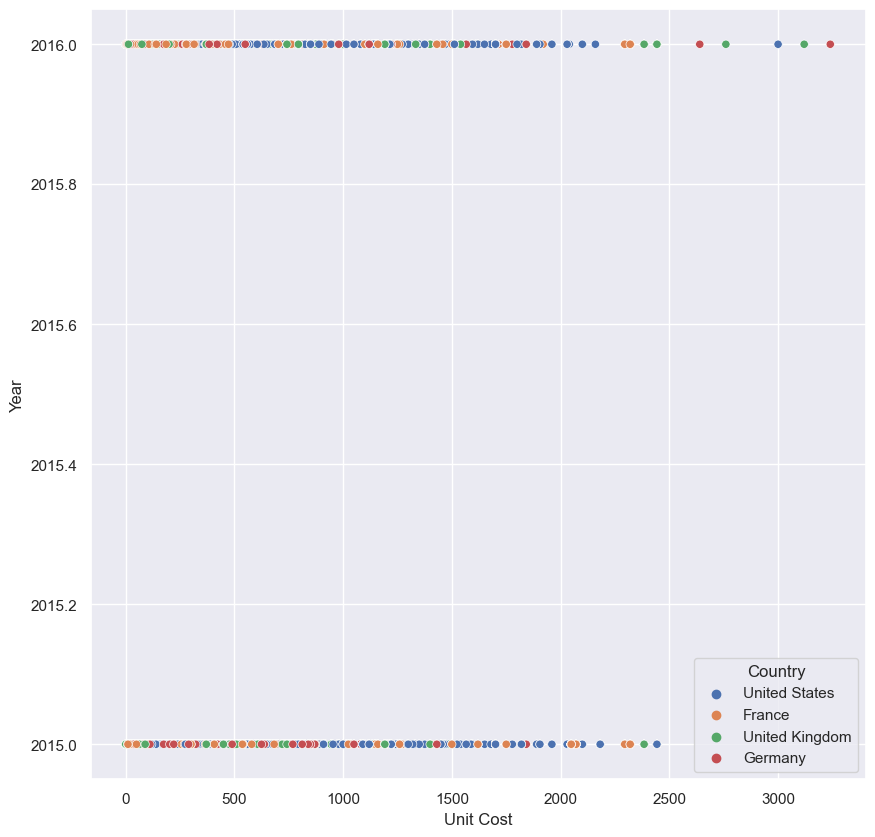

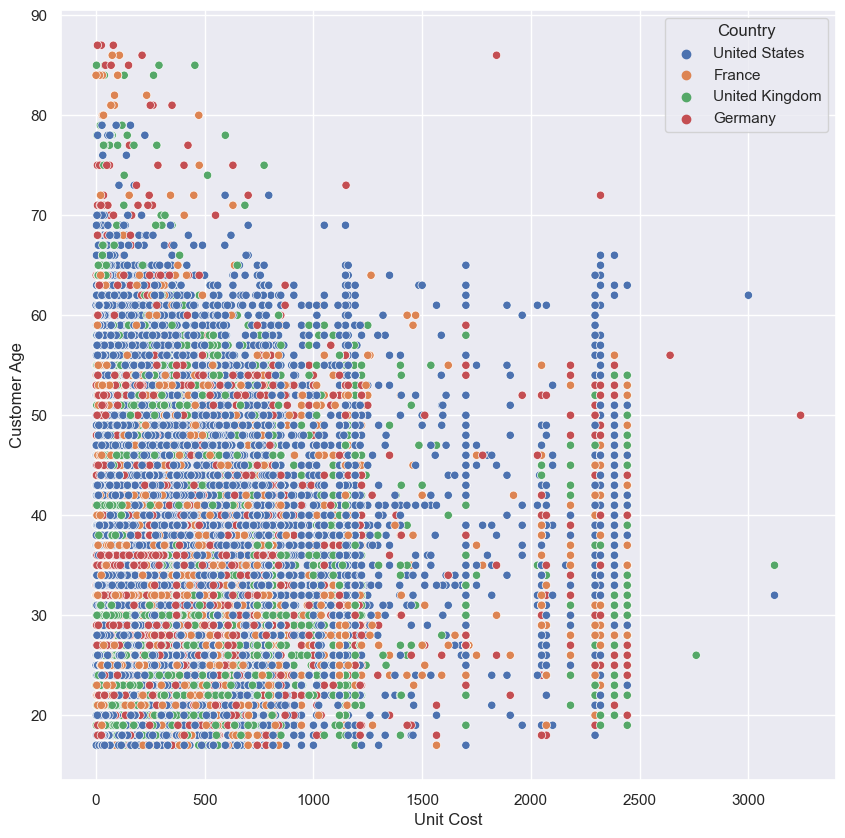

In [87]:
for x in numColumns:
    for y in numColumns:
        if x == y:
            continue
        else:
            sns.set()
            plt.figure(figsize=(10, 10))
            sns.scatterplot(x=x, y=y, data=df, hue='Country')
            plt.show()

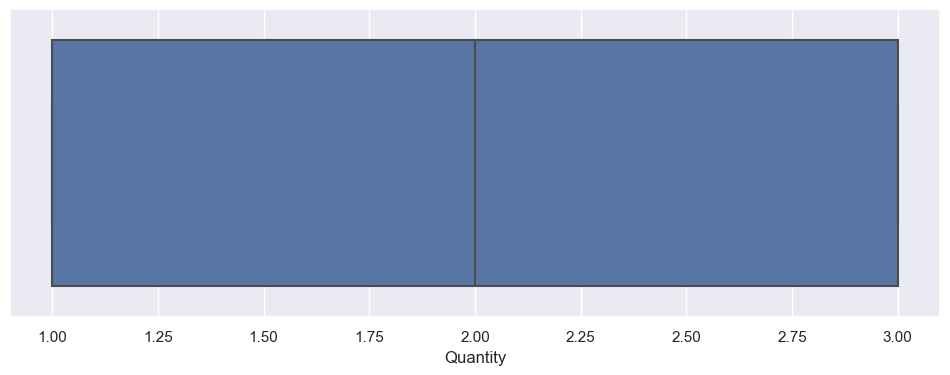

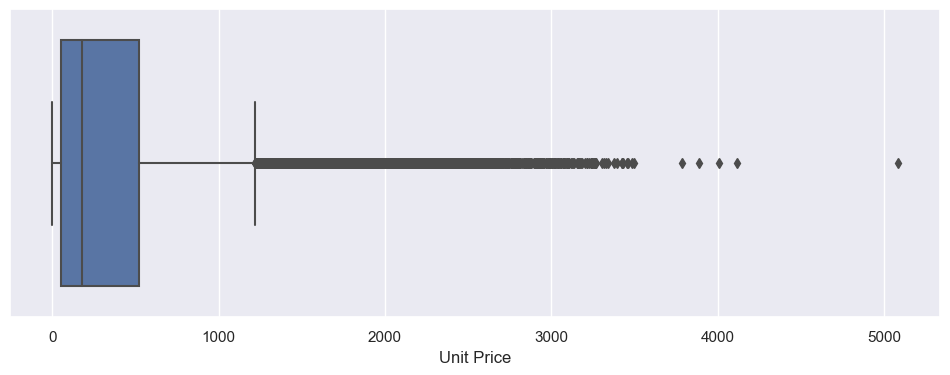

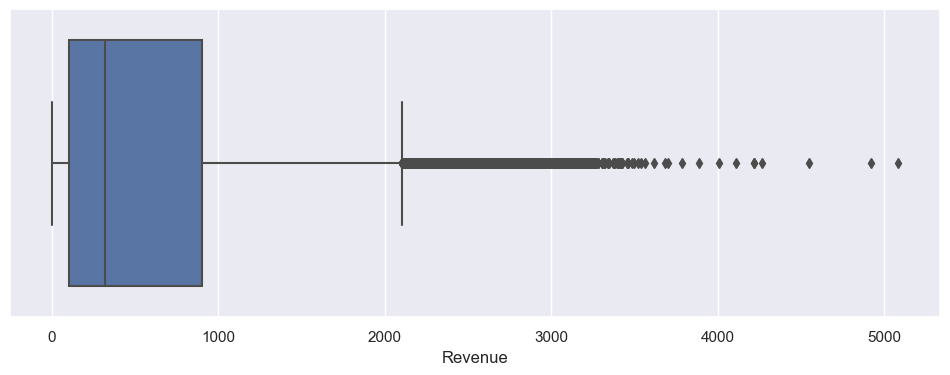

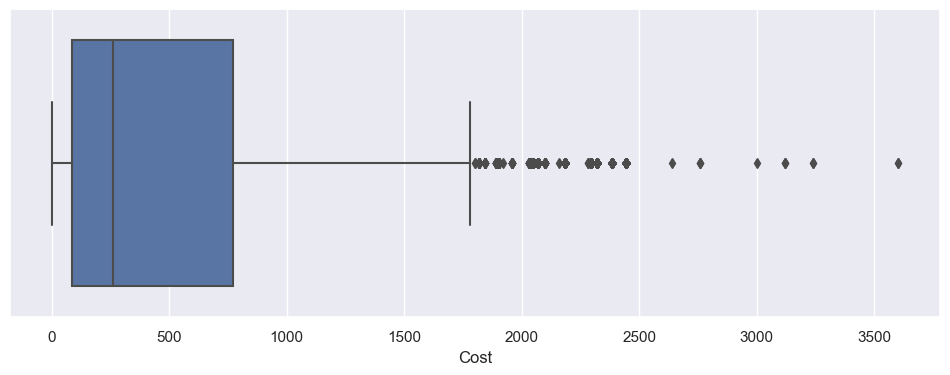

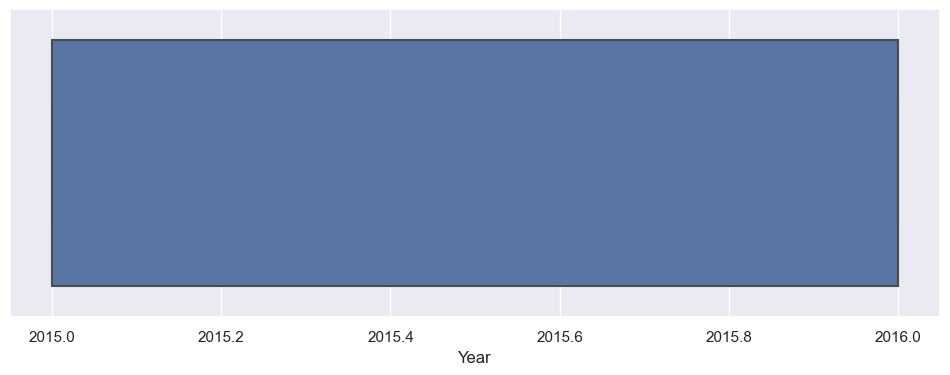

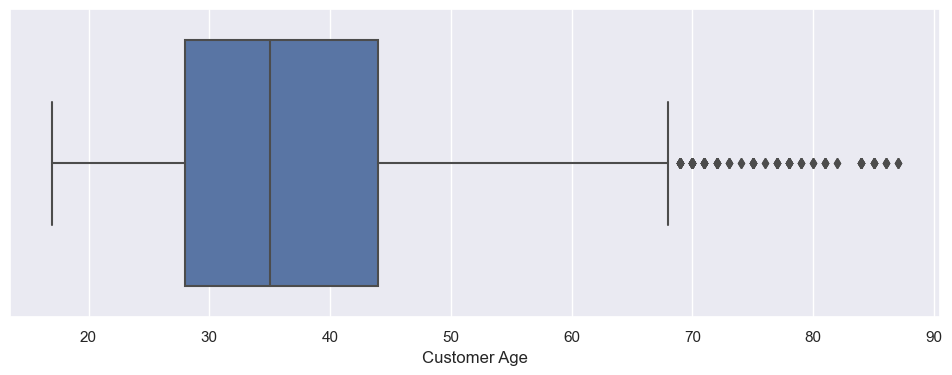

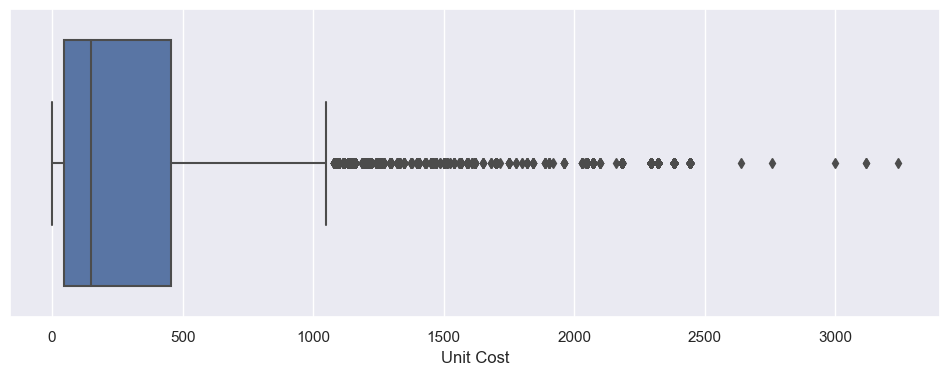

In [91]:
for x in numColumns:
        sns.set()
        plt.figure(figsize=(12, 4))
        sns.boxplot(data=df, x=x)
        plt.show()

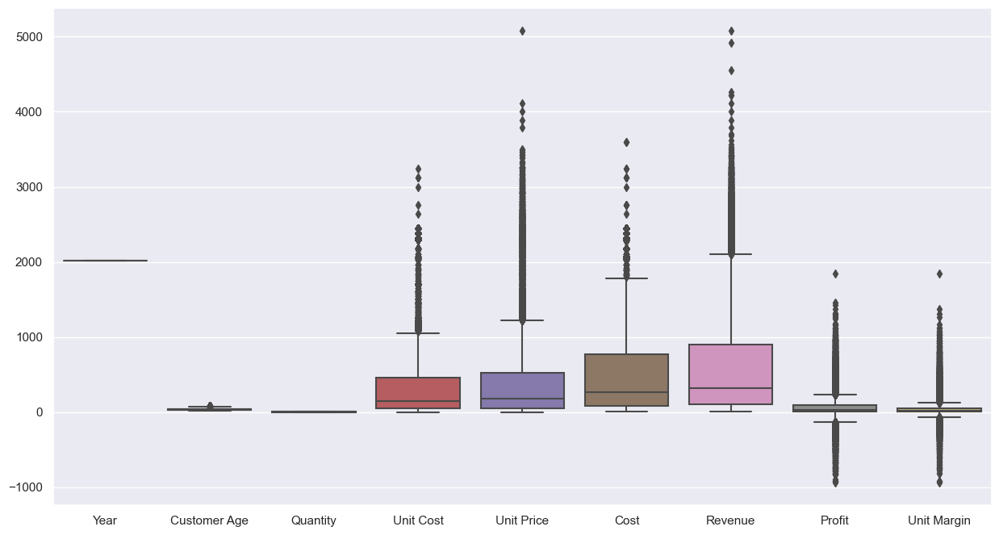

In [97]:
sns.set()
plt.figure(figsize=(15, 8))
sns.boxplot(df)
plt.show()

C:\Users\Pinil\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2500x2500 with 0 Axes>

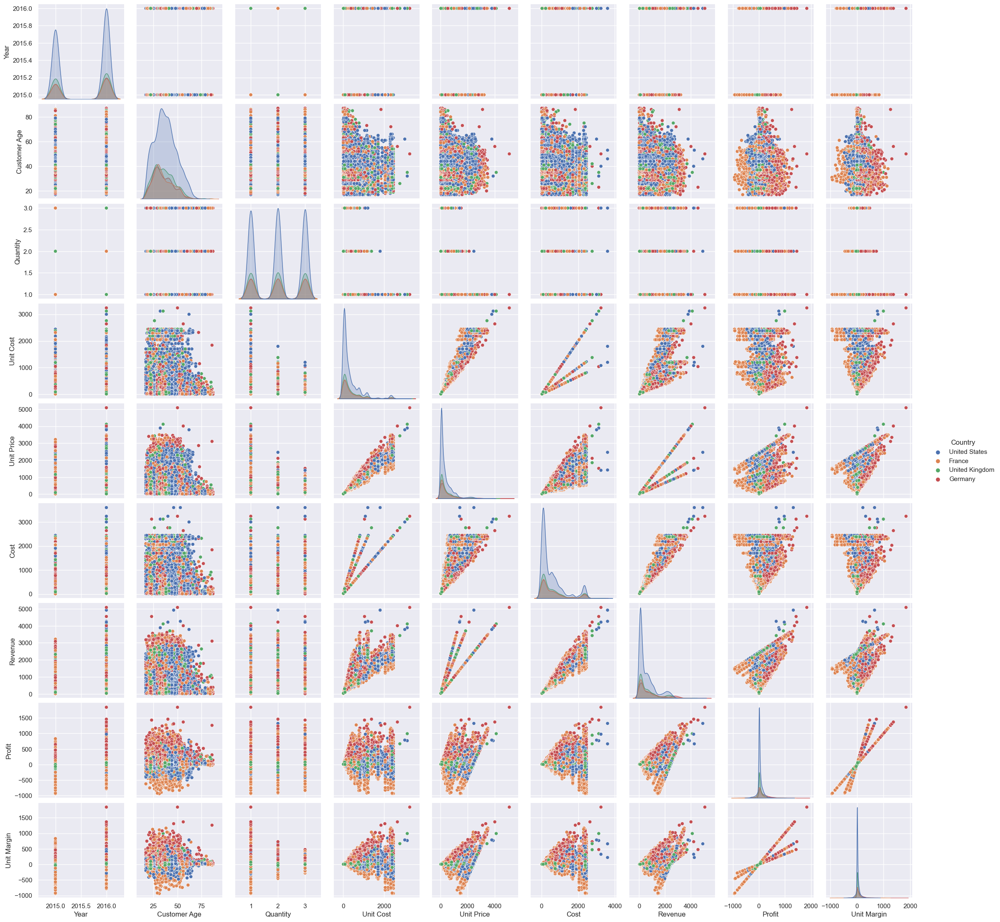

In [99]:
sns.set()
plt.figure(figsize=(25, 25))
sns.pairplot(data=df, hue='Country')
plt.show()

In [103]:
subCategoryGroup=df.groupby('Sub Category').sum(numeric_only=True)
subCategoryGroup

,Year,Customer Age,Quantity,Unit Cost,Unit Price,Cost,Revenue,Profit,Unit Margin
Sub Category,,,,,,,,,
Bike Racks,207648.0,3984.0,204.0,68680.00,9.124150e+04,105960.0,140854.0,34894.0,22561.499998
Bike Stands,292244.0,5332.0,304.0,74147.00,8.877533e+04,125610.0,150911.0,25301.0,14628.333333
Bottles and Cages,10672544.0,193292.0,10558.0,354852.85,4.338952e+05,579840.0,709407.0,129567.0,79042.316678
Caps,3057642.0,54236.0,3020.0,131458.50,1.579977e+05,212382.0,255992.0,43610.0,26539.166661
Cleaners,1098487.0,20291.0,1102.0,41523.03,5.038650e+04,68223.0,82887.0,14664.0,8863.469994
Fenders,1536192.0,28882.0,1494.0,164637.78,2.110107e+05,257801.0,329204.0,71403.0,46372.886666
Gloves,967680.0,17837.0,913.0,115074.68,1.438718e+05,182536.0,228353.0,45817.0,28797.153328
Helmets,8417035.0,152206.0,8387.0,1340488.53,1.652028e+06,2219735.0,2738210.0,518475.0,311539.803322
Hydration Packs,798163.0,14755.0,786.0,203307.52,2.495553e+05,330935.0,403276.0,72341.0,46247.813334


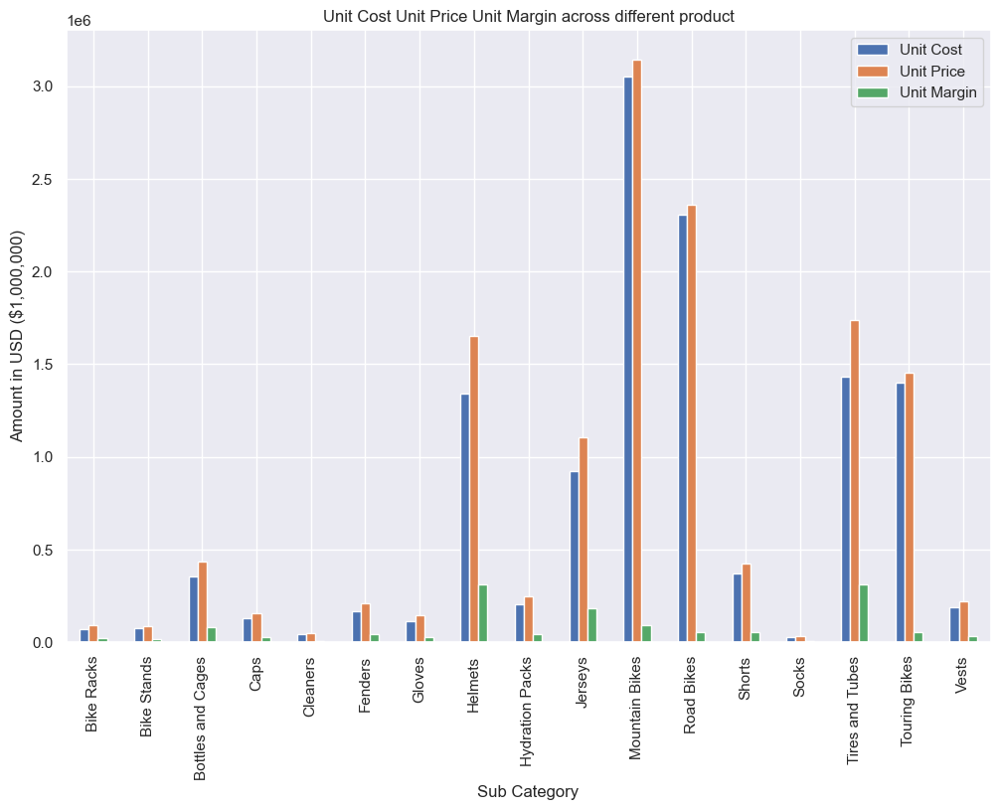

In [117]:
subCategoryGroup[['Unit Cost', 'Unit Price', 'Unit Margin']].plot(kind='bar', figsize=(12, 8))
plt.title('Unit Cost Unit Price Unit Margin across different product')
plt.ylabel('Amount in USD ($1,000,000)')
plt.xlabel('Sub Category')
plt.show()

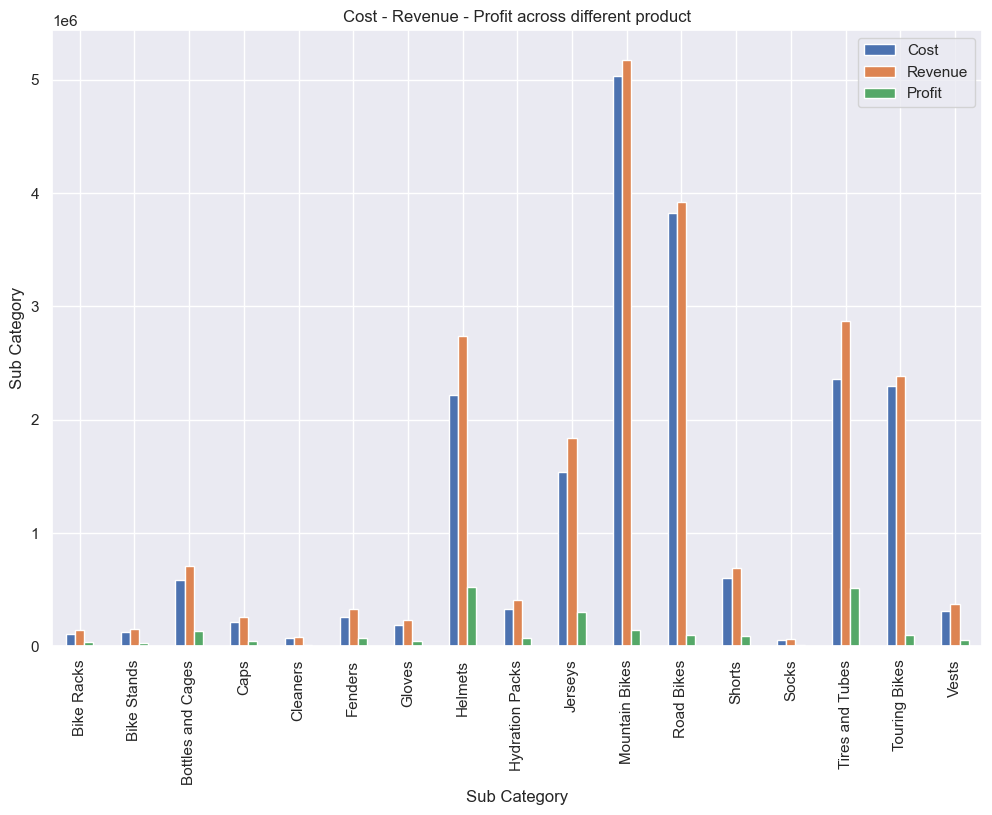

In [120]:
subCategoryGroup[['Cost', 'Revenue', 'Profit']].plot(kind='bar', figsize=(12, 8))
plt.title('Cost - Revenue - Profit across different product')
plt.ylabel('Amount in USD ($1,000,000)')
plt.ylabel('Sub Category')
plt.show()